Q1 Use fig.add_[h/v]line() and fig.add_[h/v]rect() to mark, respspectively, location (mean and median) and scale (range, interquartile range, and a range defined by two standard deviations away from the mean in both directions) of flipper_length_mm for each species onto plotly histograms of flipper_length_mm for each species in the penguins dataset

In [ ]:
import pandas as pd
import plotly
import plotly.express as px

array(['Adelie', 'Chinstrap', 'Gentoo'], dtype=object)

In [ ]:
penguins = pd.read_csv("https://raw.githubusercontent.com/mwaskom/seaborn-data/master/penguins.csv")
penguins

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,MALE
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,FEMALE
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,FEMALE
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,FEMALE
...,...,...,...,...,...,...,...
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,NaN
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,FEMALE
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,MALE
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,FEMALE


In [ ]:
import plotly.graph_objects as go
import numpy as np
stats = penguins.groupby('species')['flipper_length_mm'].agg(
    mean='mean',
    median='median',
    min='min',
    max='max',
    q1=lambda x: np.percentile(x, 25),
    q3=lambda x: np.percentile(x, 75),
    std='std'
).reset_index()
stats['mean_minus_2std'] = stats['mean'] - 2 * stats['std']
stats['mean_plus_2std'] = stats['mean'] + 2 * stats['std']

fig = px.histogram(penguins, x='flipper_length_mm', color='species', barmode='overlay', nbins=30)
for _, row in stats.iterrows():

    fig.add_vline(x=row['mean'], line_dash="dash", line_color="green", annotation_text="mean", annotation_position="top left")
    fig.add_vline(x=row['median'], line_dash="dash", line_color="blue", annotation_text="median", annotation_position="top right")

    fig.add_vrect(x0=row['min'], x1=row['max'], fillcolor="red", opacity=0.2, line_width=0, annotation_text="range", annotation_position="top left")
    fig.add_vrect(x0=row['q1'], x1=row['q3'], fillcolor="yellow", opacity=0.4, line_width=0, annotation_text="IQR", annotation_position="bottom left")
    fig.add_vrect(x0=row['mean_minus_2std'], x1=row['mean_plus_2std'], fillcolor="blue", opacity=0.3, line_width=0, annotation_text="mean ± 2std", annotation_position="inside")

fig.show(renderer="png")

<ipython-input-2-244f5fe50bd8>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(pingees, x='bill_length_mm', y='sex', inner='stick', palette='Dark2')


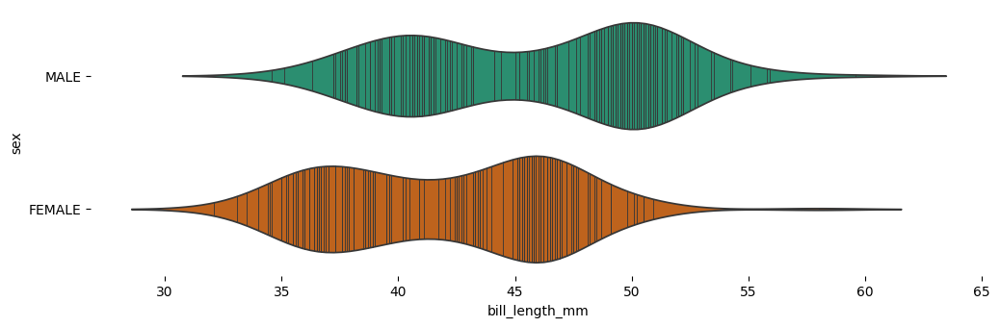

In [ ]:
# @title sex vs bill_length_mm

# from matplotlib import pyplot as plt
# import seaborn as sns
# figsize = (12, 1.2 * len(pingees['sex'].unique()))
# plt.figure(figsize=figsize)
# sns.violinplot(pingees, x='bill_length_mm', y='sex', inner='stick', palette='Dark2')
# sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
# import plotly.offline as pyo
# # Set notebook mode to work in offline
# pyo.init_notebook_mode()
# import plotly.express as px
# #data_canada = px.data.gapminder().query("country == 'Canada'")
# #fig = px.bar(data_canada, x='year', y='pop')

# # OOPS! This needs an x-position and a y-height value!
# fig = px.bar(pingees.species.value_counts().reset_index(), x='species', y='count')
# fig.show(renderer="png")

# pingees.species.value_counts().reset_index()

,species,count
0,Adelie,152
1,Gentoo,124
2,Chinstrap,68


In [ ]:
# import plotly.express as px
# df = px.data.tips()
# #fig = px.histogram(df, x="total_bill")
# fig = px.histogram(pingees, x="flipper_length_mm")
# fig.show(renderer="png")

# # So what is this showing?
# #import plotly.express as px
# #df = px.data.tips()
# ## Here we use a column with categorical data
# #fig = px.histogram(df, x="day")
# fig = px.histogram(pingees, x="species")
# fig.show(renderer="png")

# # So what happened here?
# # (There's a hint below showing that `Object` type data is treated as categorical data)
# pingees.dtypes # remember this?

,0
species,object
island,object
bill_length_mm,float64
bill_depth_mm,float64
flipper_length_mm,float64
body_mass_g,float64
sex,object


In [ ]:
# fig = px.box(pingees, x="flipper_length_mm") # or change orientation by using "y"
# fig.show(renderer="png")

In [ ]:
# fig = px.box(pingees, x="species", y="flipper_length_mm")
# fig.show(renderer="png")

# # Does this help explain things?
# # You have to look farther into the plotly histogram documention
# # but if you scroll a little bit you can find this

# #import plotly.express as px
# #df = px.data.tips()
# #fig = px.histogram(df, x="total_bill", color="sex")
# fig = px.histogram(pingees, color="species", x="flipper_length_mm")
# fig.show(renderer="png")

# # Does this help explain things?
# # And if you look just a little farther back in the plotly box plot documention
# # you can find this... just a little bit down

# #import plotly.express as px
# #df = px.data.tips()
# fig = px.box(pingees, x="species", y="flipper_length_mm", points="all")
# fig.show(renderer="png")


Q2Transition your ChatBot session from the previous problem to repeat the previous problem, but this time using seaborn kernel density estimation (KDE) plots to produce the desired figures organized in row of three plots

<ipython-input-6-d43ad1b0a40e>:10: FutureWarning:

The provided callable <function mean at 0x7e4e71774310> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.

<ipython-input-6-d43ad1b0a40e>:10: FutureWarning:

The provided callable <function median at 0x7e4e7115b9a0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.

<ipython-input-6-d43ad1b0a40e>:10: FutureWarning:

The provided callable <function min at 0x7e4e71753ac0> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.

<ipython-input-6-d43ad1b0a40e>:10: FutureWarning:

The provided callable <function max at 0x7e4e717539a0> is currently using SeriesGroupBy.max. In a future v

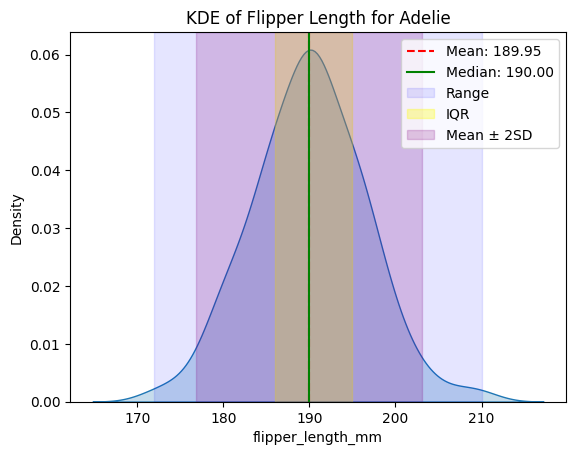

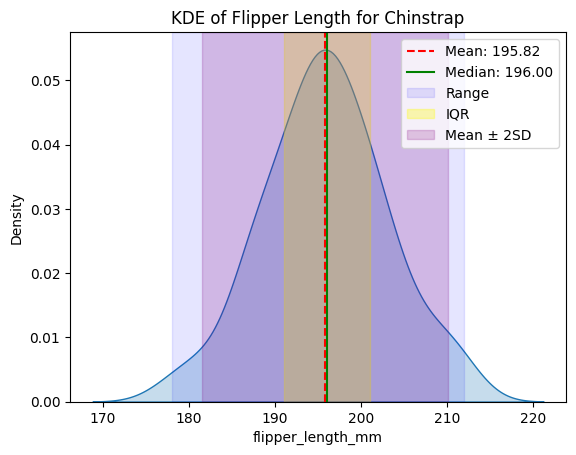

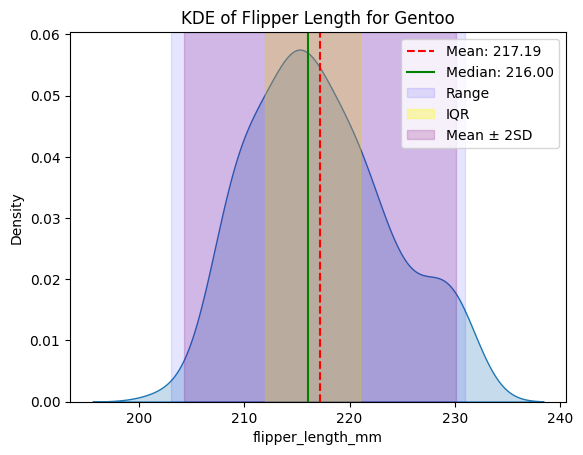

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

penguins = penguins.dropna(subset=['flipper_length_mm'])


stats = penguins.groupby('species')['flipper_length_mm'].agg(
    mean=np.mean,
    median=np.median,
    min=np.min,
    max=np.max,
    q1=lambda x: np.percentile(x, 25),
    q3=lambda x: np.percentile(x, 75),
    std=np.std
).reset_index()


for _, row in stats.iterrows():
    species_data = penguins[penguins['species'] == row['species']]

    sns.kdeplot(data=species_data, x='flipper_length_mm', fill=True)

    plt.axvline(row['mean'], color='red', linestyle='--', label=f'Mean: {row["mean"]:.2f}')
    plt.axvline(row['median'], color='green', linestyle='-', label=f'Median: {row["median"]:.2f}')

    plt.axvspan(row['min'], row['max'], alpha=0.1, color='blue', label='Range')
    plt.axvspan(row['q1'], row['q3'], alpha=0.3, color='yellow', label='IQR')
    plt.axvspan(row['mean'] - 2 * row['std'], row['mean'] + 2 * row['std'], alpha=0.2, color='purple', label='Mean ± 2SD')

    plt.title(f'KDE of Flipper Length for {row["species"]}')
    plt.legend()

    plt.show()
    fig.show(renderer="png")


Q3Discuss the basic difference between histograms and kernel density estimators your ChatBot and describe your preference for one or the other and your rationale for this preference

### The Basic Differences Between Histograms and Kernel Density Estimation (KDE)

1. **Definition and Construction**:
   - **Histogram**: Consists of multiple bins, each representing the number of observations falling within that bin. The height of each bin represents the frequency or probability of that interval.
   - **Kernel Density Estimation (KDE)**: Estimates a continuous probability density curve by weighting the observations around each data point using a kernel function. The smoothness of the KDE is controlled by the bandwidth parameter.

2. **Use Cases**:
   - **Histogram**: Suitable for cases where accurate counts are needed, or when the data is inherently categorical or discrete.
   - **KDE**: More useful when a clear, smooth overview of the data distribution is needed, especially for identifying distribution patterns and trends.

### Personal Preference and Reasons

- **Preference for KDE**: In exploratory data analysis, I tend to use KDE when understanding the shape of the data distribution is more important than knowing exact frequencies. KDE handles outliers gracefully through smoothing, providing a clearer view of the data distribution.
  
- **Using Histograms**: I use histograms when detailed structural insights are needed or when dealing with discrete data categories.

In conclusion, the choice between a histogram and KDE can also involve combining both methods—using histograms for detailed structural insights and KDE for understanding the overall data distribution. This approach leverages the strengths of both techniques, offering a comprehensive view of the data.

Q4
Run the code below and look at the resulting figure of distrubutions and then answer the following questions


Which datasets have similar means and similar variances

Which datasets have similar means but quite different variances

Which datasets have similar variances but quite different means

Which datasets have quite different means and quite different variances


In [ ]:
from scipy import stats
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np

n=1500
data1 = stats.uniform.rvs(0, 10, size=n)
data2 = stats.norm.rvs(5, 1.5, size=n)
data3 = np.r_[stats.norm.rvs(2, 0.25, size=int(n/2)), stats.norm.rvs(8, 0.5, size=int(n/2))]
data4 = stats.norm.rvs(6, 0.5, size=n)

fig = make_subplots(rows=1, cols=4)

fig.add_trace(go.Histogram(x=data1, name='A', nbinsx=30, marker=dict(line=dict(color='black', width=1))), row=1, col=1)
fig.add_trace(go.Histogram(x=data2, name='B', nbinsx=15, marker=dict(line=dict(color='black', width=1))), row=1, col=2)
fig.add_trace(go.Histogram(x=data3, name='C', nbinsx=45, marker=dict(line=dict(color='black', width=1))), row=1, col=3)
fig.add_trace(go.Histogram(x=data4, name='D', nbinsx=15, marker=dict(line=dict(color='black', width=1))), row=1, col=4)

fig.update_layout(height=300, width=750, title_text="Row of Histograms")
fig.update_xaxes(title_text="A", row=1, col=1)
fig.update_xaxes(title_text="B", row=1, col=2)
fig.update_xaxes(title_text="C", row=1, col=3)
fig.update_xaxes(title_text="D", row=1, col=4)
fig.update_xaxes(range=[-0.5, 10.5])

for trace in fig.data:
    trace.xbins = dict(start=0, end=10)

fig.show(renderer="png")

In [ ]:
mean1, var1 = np.mean(data1), np.var(data1)
mean2, var2 = np.mean(data2), np.var(data2)
mean3, var3 = np.mean(data3), np.var(data3)
mean4, var4 = np.mean(data4), np.var(data4)

results = {
    'Data1': (mean1, var1),
    'Data2': (mean2, var2),
    'Data3': (mean3, var3),
    'Data4': (mean4, var4)
}

results

{'Data1': (5.01854923146123, 8.730756945313978),
 'Data2': (5.063947548297149, 2.1588627382453125),
 'Data3': (5.004793870476702, 9.13589634961805),
 'Data4': (6.019121350512374, 0.2495374134408203)}

Datasets with similar means and similar variances:

Data1 and Data3 have similar means (around 5) and higher variances (around 8 and 9).

Datasets with similar means but quite different variances:

Data1 and Data2 have similar means (around 5) but different variances (8.32 vs 2.16).
Data2 and Data3 also have close means but significantly different variances.
Datasets with similar variances but quite different means:

None of the datasets pair up to have similar variances with substantially different means.
Datasets with quite different means and quite different variances:

Data2 and Data4 have different means (4.93 vs 6.00) and variances (2.16 vs 0.27).
Data1 and Data4 also have quite different means (5.06 vs 6.00) and very different variances (8.32 vs 0.27).
Data3 and Data4 also have quite different means (5.004 vs 6.00) and very different variances (9.14 vs 0.27).

5. Start a new ChatBot session to explore the general relationship between the mean and median and "right" and "left" skewness (and why this is); what the following code does and how it works; and then explain (in your own words) the relationship between the mean and median and "right" and "left" skewness and what causes this, using and extending the code to demonstrate your explanation through a sequence of notebook cells.

In [ ]:
from scipy import stats
import pandas as pd
import numpy as np
import plotly.express as px

sample1 = stats.gamma(a=2, scale=2).rvs(size=1000)

fig1 = px.histogram(pd.DataFrame({'data': sample1}), x="data")
fig1.show(renderer="colab")

mean1 = sample1.mean()
median1 = np.quantile(sample1, 0.5)

mean1, median1

(4.202045478801961, 3.709368234640033)

Let's break down your question into parts and explore the relationship between the mean and median in "right" and "left" skewness, along with an explanation of the provided code.

### Relationship Between Mean, Median, and Skewness

#### 1. **Understanding Skewness:**
   - **Right (Positive) Skewness:**
     In a right-skewed distribution, the tail on the right side (higher values) is longer than the left side. The mean is pulled to the right by the outliers in the tail, making the mean greater than the median.
   
   - **Left (Negative) Skewness:**
     In a left-skewed distribution, the tail on the left side (lower values) is longer. Here, the mean is pulled to the left, making the mean smaller than the median.

   - **Why does this happen?**:
     The mean is sensitive to extreme values (outliers) because it considers all values in the data. The median, however, only depends on the middle value of the dataset, so it is not as affected by outliers. In a right-skewed distribution, large values pull the mean to the right; in a left-skewed distribution, small values pull the mean to the left.

#### 2. **Code Explanation:**

   Let's look at the provided code and explain what it does step by step:

```python
from scipy import stats
import pandas as pd
import numpy as np
import plotly.express as px

sample1 = stats.gamma(a=2, scale=2).rvs(size=1000)

fig1 = px.histogram(pd.DataFrame({'data': sample1}), x="data")
fig1.show(renderer="colab")

mean1 = sample1.mean()
median1 = np.quantile(sample1, 0.5)

mean1, median1
```

- **Step 1:**
  ```python
  sample1 = stats.gamma(a=2, scale=2).rvs(size=1000)
  ```
  This line generates a sample of 1000 random values from a Gamma distribution. The parameters `a=2` (shape) and `scale=2` specify the shape of the Gamma distribution. A Gamma distribution is typically **right-skewed**.

- **Step 2:**
  ```python
  fig1 = px.histogram(pd.DataFrame({'data': sample1}), x="data")
  fig1.show(renderer="colab")
  ```
  This section creates a histogram of the sample data using Plotly and displays the result. The histogram allows us to visually examine the distribution of the sample.

- **Step 3:**
  ```python
  mean1 = sample1.mean()
  median1 = np.quantile(sample1, 0.5)
  ```
  This calculates:
  - `mean1`: The mean (average) of the sample data.
  - `median1`: The median (50th percentile) of the sample data.

- **Step 4:**
  ```python
  mean1, median1
  ```
  This outputs the calculated mean and median. In a right-skewed distribution, we expect the mean to be larger than the median.

#### 3. **Explaining the Relationship Between Mean and Median in Skewed Distributions:**

   - **Right-Skewed Distribution (Positive Skew):** The mean is typically larger than the median because the mean is pulled towards the tail of higher values.
   - **Left-Skewed Distribution (Negative Skew):** The mean is typically smaller than the median because the mean is pulled towards the tail of lower values.

### Extending the Code to Demonstrate the Relationship Between Mean, Median, and Skewness:

We can modify the code to generate both right-skewed and left-skewed distributions, and then compare the means and medians.

#### Code Demonstration:

```python
import pandas as pd
import numpy as np
import plotly.express as px
from scipy import stats

# Generate right-skewed data (e.g., gamma distribution)
sample_right_skewed = stats.gamma(a=2, scale=2).rvs(size=1000)

# Generate left-skewed data (e.g., negative of gamma distribution)
sample_left_skewed = -stats.gamma(a=2, scale=2).rvs(size=1000)

# Plot histograms for both
fig1 = px.histogram(pd.DataFrame({'data': sample_right_skewed}), x="data", title="Right Skewed Distribution")
fig1.show()

fig2 = px.histogram(pd.DataFrame({'data': sample_left_skewed}), x="data", title="Left Skewed Distribution")
fig2.show()

# Calculate and print mean and median for both
mean_right = sample_right_skewed.mean()
median_right = np.quantile(sample_right_skewed, 0.5)

mean_left = sample_left_skewed.mean()
median_left = np.quantile(sample_left_skewed, 0.5)

print("Right-Skewed Data: Mean =", mean_right, ", Median =", median_right)
print("Left-Skewed Data: Mean =", mean_left, ", Median =", median_left)
```

### Explanation of the Extended Code:
- **Right-Skewed Distribution (Gamma Distribution):**
  We use the `stats.gamma` function to generate data, which is right-skewed. We then plot the histogram and calculate the mean and median.

- **Left-Skewed Distribution (Negative Gamma):**
  To simulate a left-skewed distribution, we generate the negative values of the Gamma distribution. Again, we plot the histogram and calculate the mean and median.

- **Result:**
  In the right-skewed case, the mean will be larger than the median. In the left-skewed case, the mean will be smaller than the median.

### Conclusion:
The relationship between the mean and median is crucial in understanding skewness:
- **Right-Skewed (Positive Skew):** The mean is larger than the median.
- **Left-Skewed (Negative Skew):** The mean is smaller than the median.

This difference is caused by the sensitivity of the mean to outliers, whereas the median is resistant to extreme values. By using distributions such as the Gamma distribution, we can visually and numerically demonstrate this relationship.

In [ ]:
sample2 = -stats.gamma(a=2, scale=2).rvs(size=1000)

fig2 = px.histogram(pd.DataFrame({'data': sample2}), x="data")
fig2.show(renderer="colab")

mean2 = sample2.mean()
median2 = np.quantile(sample2, 0.5)

mean2, median2

(-3.970970231787505, -3.3850086308328513)


In the right skewed dataset (sample1), the mean is greater than the median.
In the left skewed dataset (sample2), the mean is less than the median.


Q6Go find an interesting dataset and use summary statistics and visualizations to understand and demonstate some interesting aspects of the data

In [ ]:
import pandas as pd
df = pd.read_csv("https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2024/2024-02-13/historical_spending.csv")
print(df.head())

   Year  PercentCelebrating  PerPerson  Candy  Flowers  Jewelry  \
0  2010                  60     103.00   8.60    12.33    21.52   
1  2011                  58     116.21  10.75    12.62    26.18   
2  2012                  59     126.03  10.85    13.49    29.60   
3  2013                  60     130.97  11.64    13.48    30.94   
4  2014                  54     133.91  10.80    15.00    30.58   

   GreetingCards  EveningOut  Clothing  GiftCards  
0           5.91       23.76     10.93       8.42  
1           8.09       24.86     12.00      11.21  
2           6.93       25.66     10.42       8.43  
3           8.32       27.93     11.46      10.23  
4           7.97       27.48     13.37       9.00  


In [ ]:
print(df.info())

print(df.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13 entries, 0 to 12
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Year                13 non-null     int64  
 1   PercentCelebrating  13 non-null     int64  
 2   PerPerson           13 non-null     float64
 3   Candy               13 non-null     float64
 4   Flowers             13 non-null     float64
 5   Jewelry             13 non-null     float64
 6   GreetingCards       13 non-null     float64
 7   EveningOut          13 non-null     float64
 8   Clothing            13 non-null     float64
 9   GiftCards           13 non-null     float64
dtypes: float64(8), int64(2)
memory usage: 1.1 KB
None
             Year  PercentCelebrating   PerPerson      Candy    Flowers  \
count    13.00000           13.000000   13.000000  13.000000  13.000000   
mean   2016.00000           55.461538  144.449231  12.837692  14.653077   
std       3.89444            

,Year,PercentCelebrating,PerPerson,Candy,Flowers,Jewelry,GreetingCards,EveningOut,Clothing,GiftCards
0,2010,60,103.00,8.60,12.33,21.52,5.91,23.76,10.93,8.42
1,2011,58,116.21,10.75,12.62,26.18,8.09,24.86,12.00,11.21
2,2012,59,126.03,10.85,13.49,29.60,6.93,25.66,10.42,8.43
3,2013,60,130.97,11.64,13.48,30.94,8.32,27.93,11.46,10.23
4,2014,54,133.91,10.80,15.00,30.58,7.97,27.48,13.37,9.00
5,2015,55,142.31,12.70,15.72,36.30,7.87,27.27,14.72,11.05
6,2016,55,146.84,13.11,14.78,33.11,8.52,33.46,15.05,12.52
7,2017,54,136.57,12.68,14.63,32.32,7.36,28.46,13.91,10.23
8,2018,55,143.56,13.12,14.75,34.10,6.55,26.96,14.04,11.04
9,2019,51,161.96,14.12,15.07,30.34,7.31,27.72,16.08,10.31


<ipython-input-40-51e8848c8364>:12: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




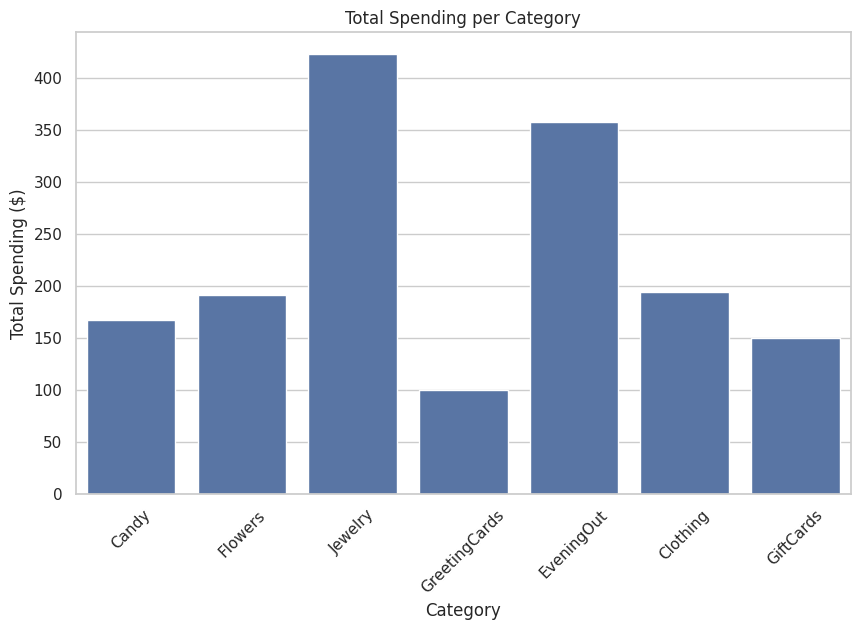

In [ ]:
import seaborn as sns

sns.set(style="whitegrid")

df_melted = df.melt(value_vars=['Candy', 'Flowers', 'Jewelry', 'GreetingCards', 'EveningOut', 'Clothing', 'GiftCards'],
                    var_name='Category', value_name='Spending')

plt.figure(figsize=(10, 6))
sns.barplot(x='Category', y='Spending', data=df_melted, estimator=sum, ci=None)
plt.title('Total Spending per Category')
plt.xlabel('Category')
plt.ylabel('Total Spending ($)')
plt.xticks(rotation=45)
plt.show()
fig.show(renderer="png")

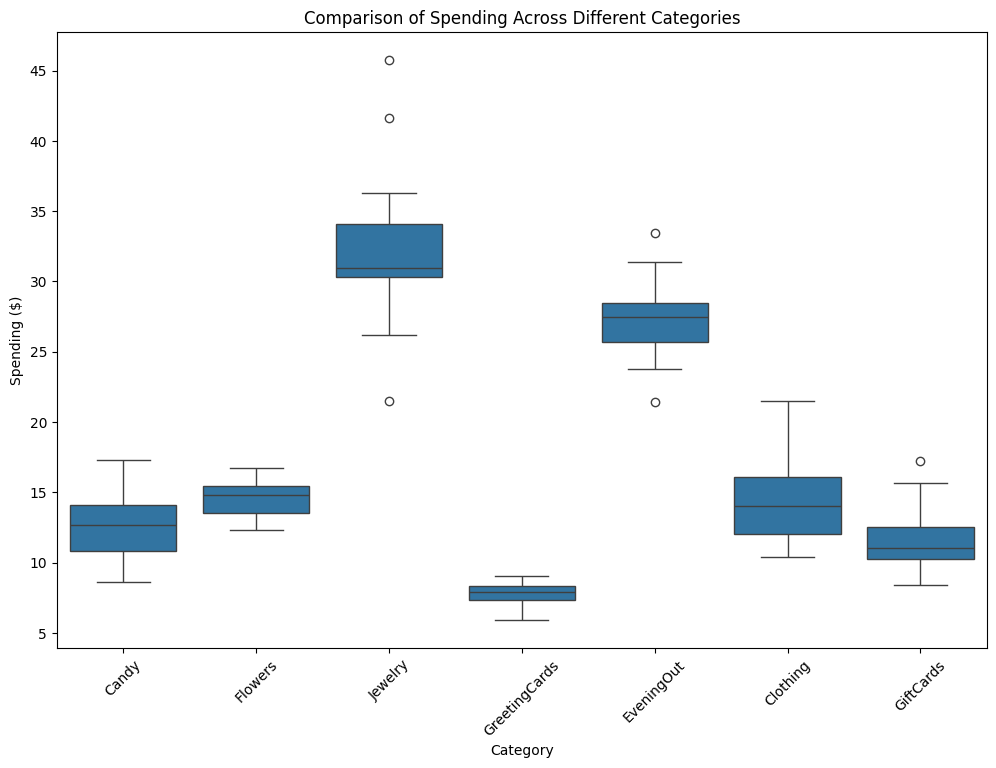

    Year   Category  Spending
0   2010      Candy      8.60
1   2011      Candy     10.75
2   2012      Candy     10.85
3   2013      Candy     11.64
4   2014      Candy     10.80
..   ...        ...       ...
86  2018  GiftCards     11.04
87  2019  GiftCards     10.31
88  2020  GiftCards     14.21
89  2021  GiftCards     15.67
90  2022  GiftCards     17.22

[91 rows x 3 columns]


In [ ]:
df_melted = df.melt(id_vars='Year', value_vars=['Candy', 'Flowers', 'Jewelry', 'GreetingCards', 'EveningOut', 'Clothing', 'GiftCards'],
                    var_name='Category', value_name='Spending')

plt.figure(figsize=(12, 8))
sns.boxplot(x='Category', y='Spending', data=df_melted)
plt.xticks(rotation=45)
plt.title('Comparison of Spending Across Different Categories')
plt.xlabel('Category')
plt.ylabel('Spending ($)')
plt.show()
fig.show(renderer="png")

print(df_melted)

<ipython-input-15-490919537b9f>:1: FutureWarning:

The provided callable <function mean at 0x7e4e71774310> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.

<ipython-input-15-490919537b9f>:1: FutureWarning:

The provided callable <function median at 0x7e4e7115b9a0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.

<ipython-input-15-490919537b9f>:1: FutureWarning:

The provided callable <function min at 0x7e4e71753ac0> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.

<ipython-input-15-490919537b9f>:1: FutureWarning:

The provided callable <function max at 0x7e4e717539a0> is currently using SeriesGroupBy.max. In a future v

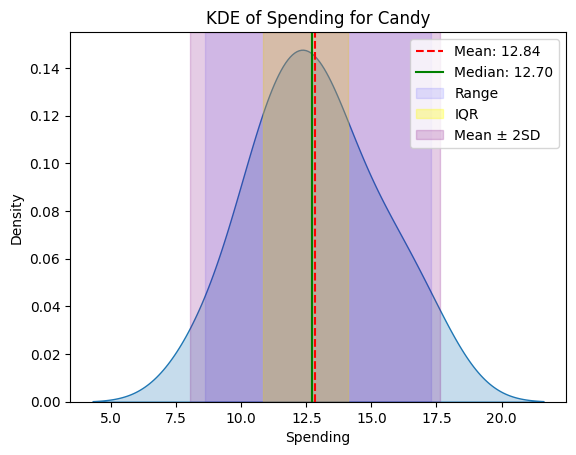

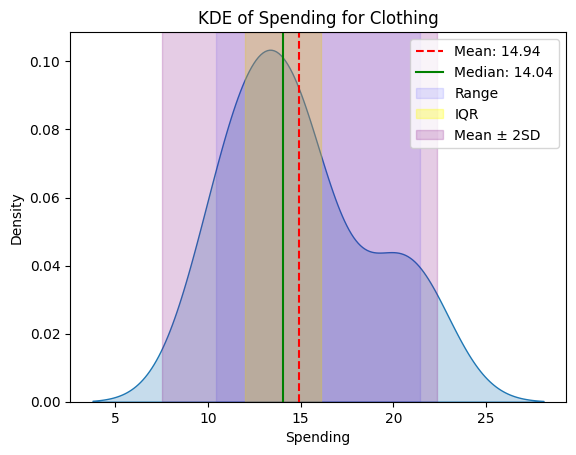

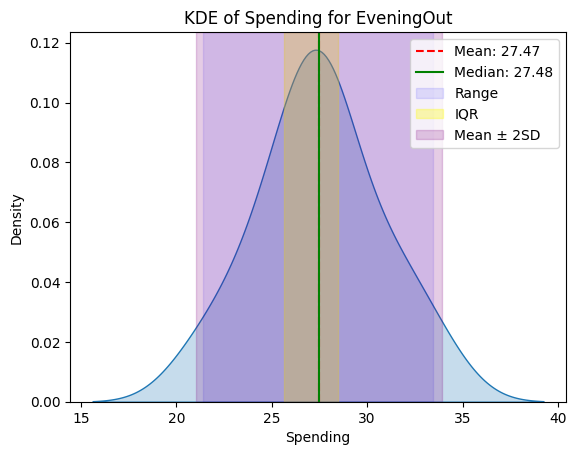

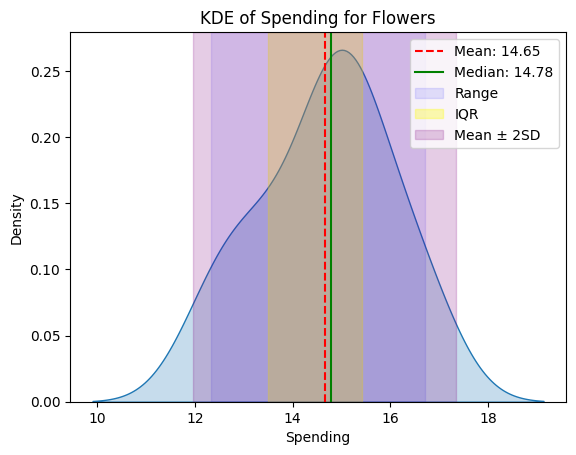

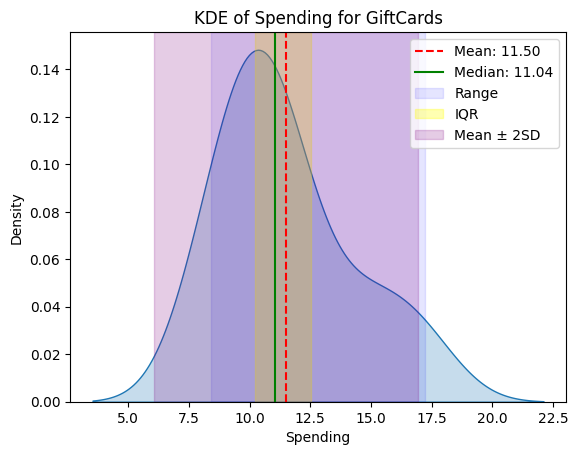

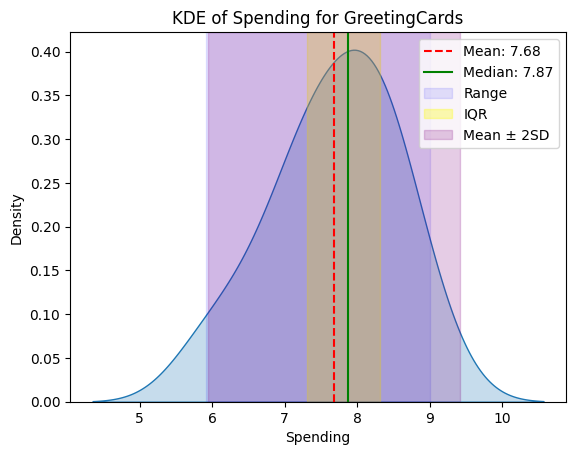

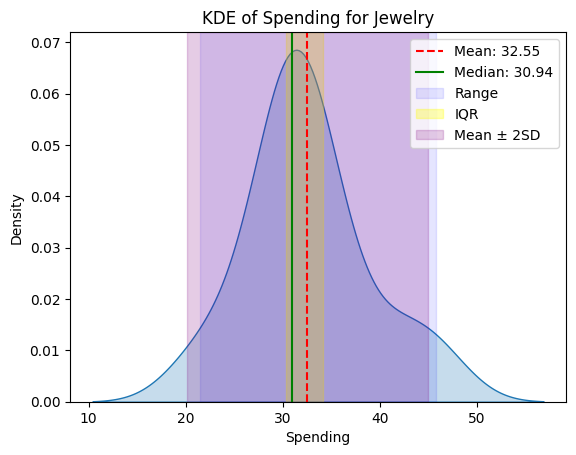

In [ ]:
stats = df_melted.groupby('Category')['Spending'].agg(
    mean=np.mean,
    median=np.median,
    min=np.min,
    max=np.max,
    q1=lambda x: np.percentile(x, 25),
    q3=lambda x: np.percentile(x, 75),
    std=np.std
).reset_index()

for _, row in stats.iterrows():
    spending_data = df_melted[df_melted['Category'] == row['Category']]

    sns.kdeplot(data=spending_data, x='Spending', fill=True)

    plt.axvline(row['mean'], color='red', linestyle='--', label=f'Mean: {row["mean"]:.2f}')
    plt.axvline(row['median'], color='green', linestyle='-', label=f'Median: {row["median"]:.2f}')

    plt.axvspan(row['min'], row['max'], alpha=0.1, color='blue', label='Range')
    plt.axvspan(row['q1'], row['q3'], alpha=0.3, color='yellow', label='IQR')
    plt.axvspan(row['mean'] - 2 * row['std'], row['mean'] + 2 * row['std'], alpha=0.2, color='purple', label='Mean ± 2SD')

    plt.title(f'KDE of Spending for {row["Category"]}')
    plt.legend()

    plt.show()
    fig.show(renderer="png")


7. Watch the classic Gapminder Video, then have a look at the plotly version and recreate the animation (perhaps after optionally exploring and changing the style, if you wish)

In [ ]:
import plotly.express as px
df = px.data.gapminder()
px.scatter(df, x="gdpPercap", y="lifeExp", animation_frame="year", animation_group="country",
           size="pop", color="continent", hover_name="country",
           log_x=True, size_max=55, range_x=[100,100000], range_y=[25,90])

In [ ]:
!pip install dash
from dash import Dash, dcc, html, Input, Output
import plotly.express as px

app = Dash(__name__)


app.layout = html.Div([
    html.H4('Animated GDP and population over decades'),
    html.P("Select an animation:"),
    dcc.RadioItems(
        id='selection',
        options=["GDP - Scatter", "Population - Bar"],
        value='GDP - Scatter',
    ),
    dcc.Loading(dcc.Graph(id="graph"), type="cube")
])


@app.callback(
    Output("graph", "figure"),
    Input("selection", "value"))
def display_animated_graph(selection):
    df = px.data.gapminder()
    animations = {
        'GDP - Scatter': px.scatter(
            df, x="gdpPercap", y="lifeExp", animation_frame="year",
            animation_group="country", size="pop", color="continent",
            hover_name="country", log_x=True, size_max=55,
            range_x=[100,100000], range_y=[25,90]),
        'Population - Bar': px.bar(
            df, x="continent", y="pop", color="continent",
            animation_frame="year", animation_group="country",
            range_y=[0,4000000000]),
    }
    return animations[selection]


app.run_server(debug=True)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 90.7 MB/s eta 0:00:00


<IPython.core.display.Javascript object>

In [ ]:
import plotly.express as px

df = px.data.gapminder()

fig = px.bar(df, x="continent", y="pop", color="continent",
  animation_frame="year", animation_group="country", range_y=[0,4000000000])
fig.show()

8. Provide a second version of the figure from the previous problem where you edit the fig = px.scatter() function from the Gapminder code so that x is "percent change", y is "rank", size is "percent", and color="sex", animation_frame is "year", and animation_group and hover_name are "name". Then use size_max=50, range_x=[-0.005,0.005]) and remove the log_x=True and range_y parameters


In [ ]:
bn = pd.read_csv('https://raw.githubusercontent.com/hadley/data-baby-names/master/baby-names.csv')
bn['name'] = bn['name']+" "+bn['sex']
bn['rank'] = bn.groupby('year')['percent'].rank(ascending=False)
bn = bn.sort_values(['name','year'])

bn['percent change'] = bn['percent'].diff()
new_name = [True]+list(bn.name[:-1].values!=bn.name[1:].values)
bn.loc[new_name,'percentage change'] = bn.loc[new_name,'percent']
bn = bn.sort_values('year')
bn = bn[bn.percent>0.001]
fig = px.scatter(bn, x="percent change",
                 y="rank",
                 size="percent",
                 color="sex",
                 animation_frame="year",
                 animation_group="name",
                 hover_name="name",
                 size_max=50,
                 range_x=[-0.005, 0.005])
fig.update_yaxes(autorange='reversed')

fig.show(renderer="png")

In [ ]:
# bn = pd.read_csv('https://raw.githubusercontent.com/hadley/data-baby-names/master/baby-names.csv')
# bn['name'] = bn['name']+" "+bn['sex'] # make identical boy and girl names distinct
# bn['rank'] = bn.groupby('year')['percent'].rank(ascending=False)
# bn = bn.sort_values(['name','year'])
# # the next three lines create the increaes or decrease in name prevalence from the last year
# bn['percent change'] = bn['percent'].diff()
# new_name = [True]+list(bn.name[:-1].values!=bn.name[1:].values)
# bn.loc[new_name,'percentage change'] = bn.loc[new_name,'percent']
# bn = bn.sort_values('year')
# bn = bn[bn.percent>0.001] # restrict to "common" names

# fig = px.scatter(bn,
#                  x="percent change",
#                  y="rank",
#                  size="percent",
#                  color="sex",
#                  animation_frame="year",
#                  animation_group="name",
#                  hover_name="name",
#                  size_max=50,
#                  range_x=[-0.005, 0.005],
#                  log_x=True, # Applying logarithmic scale to the x-axis
#                  range_y=[1, 1000]) # Setting a specific range for the y-axis

# fig.update_yaxes(autorange='reversed') # this lets us put rank 1 on the top

# fig.show(renderer="png")

ValueError: math domain error

Q9Have you reviewed the course wiki-textbook and interacted with a ChatBot (or, if that wasn't sufficient, real people in the course piazza discussion board or TA office hours) to help you understand all the material in the tutorial and lecture that you didn't quite follow when you first saw it?

**Answer:**

Yes, I have reviewed the course wiki-textbook and interacted with the ChatBot to clarify material I initially found challenging in the tutorial and lecture. The ChatBot was particularly helpful in breaking down concepts into simpler terms and providing quick explanations. For topics that were still unclear after using the ChatBot, I turned to the course Piazza discussion board, where I found insights from other students and instructors. Bur I rarely attended TA office hours when I needed more in-depth guidance or one-on-one support, next time I will try to meet the office hour which can help me better understand the concepts. Overall, these resources have been crucial in ensuring that I fully grasp the material.